## Individual Planning Stage (Project 4: Diabetes)

Written by Jessie Liang (student number: 52819596) in Group 5

### (0) Introduction of project topic



### (1) Data Description

- data source and related background information

This dataset is collected by the National Institute of Diabetes and Digestive and Kidney Diseases, with the aim of diagnosing diabetes status for new patients using several physiological measurements in a data-driven way. Note that every measurement of this dataset comes from female participants who are at least 21 years old of Pima Indian heritage.

- dimension of the dataset

There are totally 768 rows and 9 columns in this dataset. Specifically, it includes only 1 response variable and 8 potential predictors. Note that there is no row that contains missing data.

- variable descriptions

    - Pregnancies: It is a numerical variable of type integer, indicating the number of pregnancies
    - Glucose: It is a numerical variable of type integer, indicating the Glucose level in blood
    - BloodPressure: It is a numerical variable of type integer, indicating the level of blood pressure
    - SkinThickness: It is a numerical variable of type integer, indicating the thickness of skin
    - Insulin: It is a numerical variable of type integer, indicating the level of insulin in blood
    - BMI: It is a numerical variable of type double, indicating the body mass index
    - DiabetesPedigreeFunction: It is a numerical variable of type double, indicating the Diabetes percentage
    - Age: It is a numerical variable of type integer, indicating the age of the patient
    - Outcome: It is a binary response, where 1 means "Yes" (having diabetes) and 0 means "no" (not having diabetes)

### (2) Question 

- Research question: What is the best model explaining the relationship between `Outcome` (the response variable) and the other 8 potential predictors?

- How the data will help to address this question: With the dataset, we are able to try different combinations of variables to include in the model and select the ideal one based on the model output. Also, the model parameter inference relies primarily on the data, since each parameter estimate and standard error in the model are calculated according to the dataset.

- The focus of this question is on inference: The ultimate goal is to decide the best combination of explanatory variables to include in the model and the coefficients of this best model. The process of searching the model will be based on model selection methods. After the variables to include are decided, the model fitting process is exactly the process of inferring the parameters in the model using the collected data. With the model output, we can answer inference questions such as what are the confidence intervals of the parameters, and whether a particular variable in the final model is statistically significant, etc.

### (3) Exploratory Data Analysis and Visualization

In [122]:
# loading packages
library(MASS)
library(tidyverse)
library(repr)
library(digest)
library(infer)
library(gridExtra)
library(mlbench)
library(AER)
library(ISLR)
library(broom)
library(qqplotr)
library(performance)
library(see)
library(glmbb)
library(cowplot)
library(GGally)
library(ggplot2)
library(patchwork)

#### 3.1 Reading data

In [42]:
diabetes <- read.csv("diabetes.csv")
head(diabetes)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1
6,5,116,74,0,0,25.6,0.201,30,0


In [43]:
dim(diabetes)

[1] 768   9

#### 3.2 Cleaning and tidying data

To prepare for modelling later, we first drop `NA` values in the original dataset. After that, the dataset is already in a tidy format which does not require any further processing.

In [41]:
diabetes <- drop_na(diabetes)
dim(diabetes)

[1] 768   9

From the unchanged dimension we could see that the original dataset already contains no `NA` values.

#### 3.3 Visualization

#### 3.3.1 exploring poetential prooblem: multicollinearity 

Explain the reason of doing this step: While modelling, highly correlated variables will cause issues, which is the phenomenon called multicollinearity. In this case, we tend to keep only one of these correlatd variables and drop the others in the final model, or we combine them and create a single new variable to be used in the final model. Exploring multicollinearity issue is a helpful first step to get insights of the data structure, and may provide some guidance for variable selection later.

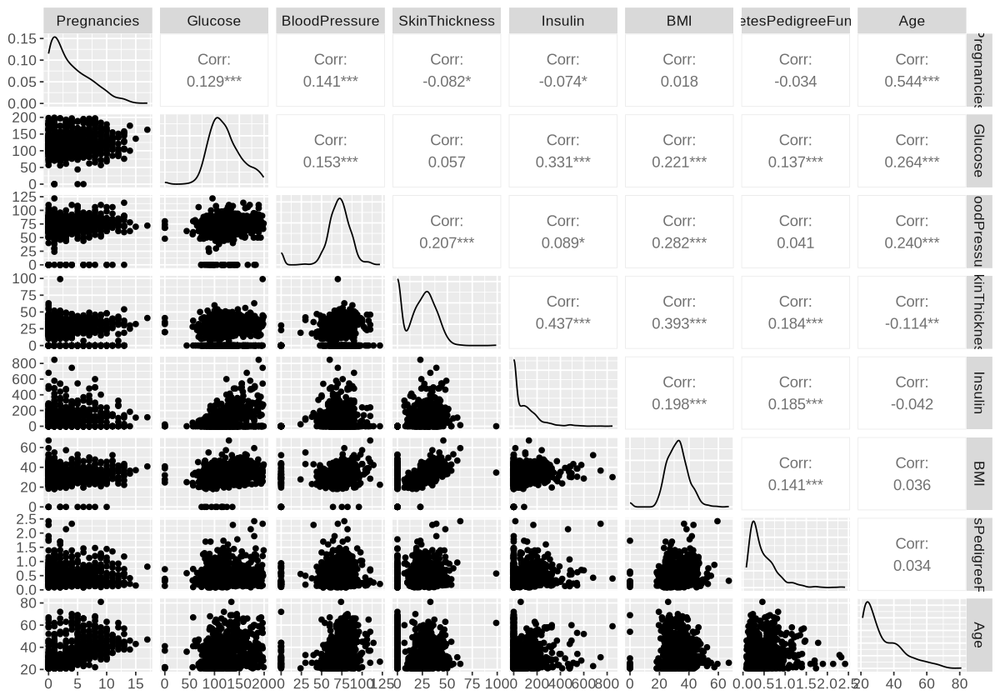

In [20]:
options(repr.plot.width = 10, repr.plot.height = 7)
diabetes_pair_plots <- 
  diabetes %>%
  select(- Outcome) %>% 
  ggpairs(progress = FALSE) +
  theme(text = element_text(size = 13))
diabetes_pair_plots

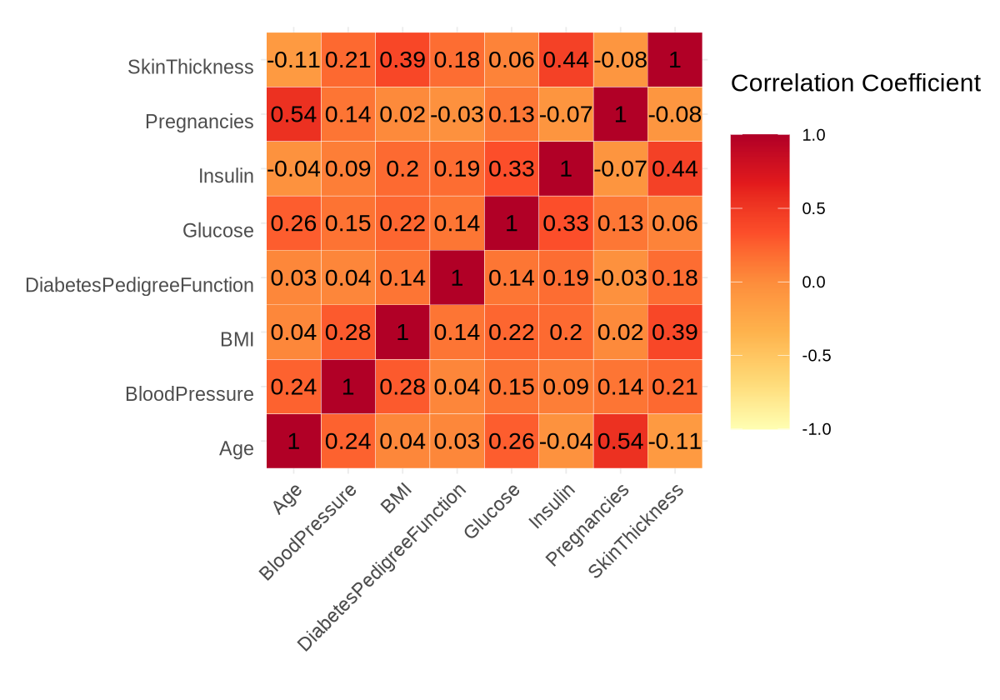

In [21]:
corr_matrix_diabetes <- 
   diabetes %>%
   select(- Outcome) %>% 
   cor() %>%
   as_tibble(rownames = 'var1') %>%
   pivot_longer(-var1, names_to = "var2", values_to = "corr")

plot_corr_matrix_diabetes <- 
  corr_matrix_diabetes %>%
  ggplot(aes(var1, var2)) +
  geom_tile(aes(fill = corr), color = "white") +
  scale_fill_distiller("Correlation Coefficient \n",
      palette =  "YlOrRd",
      direction = 1, 
      limits = c(-1, 1)
    ) +
    labs(x = "", y = "") +
    theme_minimal() +
    theme(
        axis.text.x = element_text(angle = 45, vjust = 1, size = 14, hjust = 1),
        axis.text.y = element_text(vjust = 1, size = 14, hjust = 1),
        legend.title = element_text(size = 18),
        legend.text = element_text(size = 12),
        legend.key.size = unit(1.5, "cm")
    ) +
    coord_fixed() +
  geom_text(aes(var1, var2, label = round(corr, 2)), color = "black", size = 6)

plot_corr_matrix_diabetes

Comment: According to the heatmap, multicollinearity is not a severe issue in this dataset. The highest correlation is only 0.54, which is moderate. Later, when we finish fitting the model, we could calculate the VIF values to double check this issue.

#### 3.3.2 exploring linearity between logit and predictors

One of the assumptions of logistic regression is the linear relationship between logit and the numerical variables. In other to check for linearity, we plot the empirical logit versus each numerical variable using the data.

Note that I cite the following code of constructing the `logOddsPlot` function from Nicole Dalzell's book: Statistical Coding Dictionary. (Please check details in the References section at the end)

In [125]:
# Citation: the following code is written by Nicole Dalzell

logOddsPlot <- function(x, y, xname, formulahere){
  sort = order(x)
  x = x[sort]
  y = y[sort]
  a = seq(1, length(x), by=.05*length(y))
  b = c(a[-1] - 1, length(x))
  
  prob = xmean = ns = rep(0, length(a)) # ns is for CIs
  for (i in 1:length(a)){
    range = (a[i]):(b[i])
    prob[i] = mean(y[range])
    xmean[i] = mean(x[range])
    ns[i] = b[i] - a[i] + 1 # for CI 
  }
  
  extreme = (prob == 1 | prob == 0)
  #prob[prob == 0] = min(prob[!extreme])
  #prob[prob == 1] = max(prob[!extreme])
  prob[prob == 0] = .01
  prob[prob == 1] = .99
  
  g = log(prob/(1-prob))
  
  dataHere <- data.frame("x" = b, "LogOdds" = g)
  
  suppressMessages(library(ggplot2))
  
  ggplot(dataHere, aes(x =xmean, y = LogOdds)) + geom_point() + geom_smooth(formula = formulahere, method = "lm", se = FALSE) + labs(x = xname, y = "Log Odds")
}

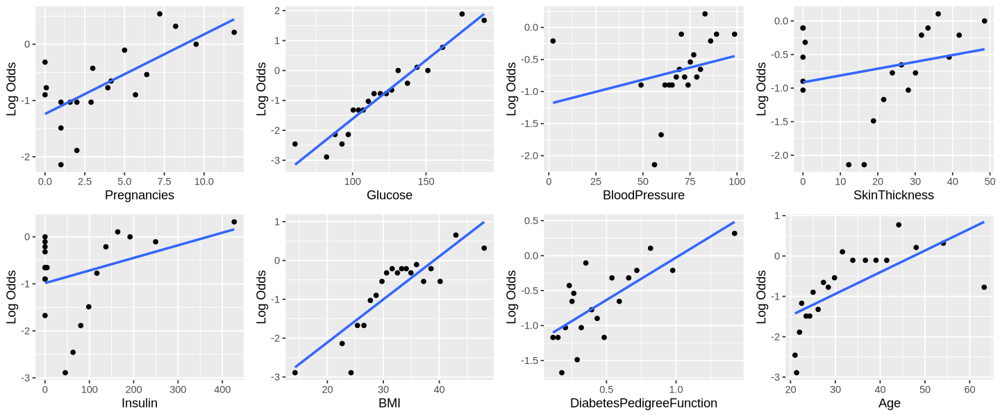

In [126]:
plot1 <- logOddsPlot(diabetes$Pregnancies, diabetes$Outcome, "Pregnancies", y~x)
plot2 <- logOddsPlot(diabetes$Glucose, diabetes$Outcome, "Glucose", y~x)
plot3 <- logOddsPlot(diabetes$BloodPressure, diabetes$Outcome, "BloodPressure", y~x)
plot4 <- logOddsPlot(diabetes$SkinThickness, diabetes$Outcome, "SkinThickness", y~x)
plot5 <- logOddsPlot(diabetes$Insulin, diabetes$Outcome, "Insulin", y~x)
plot6 <- logOddsPlot(diabetes$BMI, diabetes$Outcome, "BMI", y~x)
plot7 <- logOddsPlot(diabetes$DiabetesPedigreeFunction, diabetes$Outcome, "DiabetesPedigreeFunction", y~x)
plot8 <- logOddsPlot(diabetes$Age, diabetes$Outcome, "Age", y~x)
grid.arrange(plot1, plot2, plot3, plot4, plot5, plot6, plot7, plot8, nrow = 2)

From the above logit plots, we can make the following comments:

- the logit plot looks roughly linear for `Pregnancies`, `Glucose`,`BMI` and `DiabetesPedigreeFunction`. For these variables, it is reasonble to fit a linear function of them to model the logit.

- the linear relationship is moderately violated for `BloodPressure` since there are a few outliers.

- the logit plot deviates a lot from being linear for `SkinThickness`, `Insulin` and `Age` since the data points show a curve pattern instead of being linearly scattered. If we do need to include those variables in our model later, probably we need to transform them or add a higher order term to construct a polynomial.

#### 3.3.3 exploring groups in the observations

Groups in the observations are usually divided according to different levels of a categorical variable. However, the original dataset has only numerical explanatory variables (i.e. there is no categorical predictors), so it is not appropriate to consider dividing the data into seperate clusters here.

### References

Dalzell, Nicole . Statistical Coding Dictionary. Bookdown.org, bookdown.org/dalzelnm/bookdown-demo/logistic-regression.html#creating-mosaic-plots. Accessed 13 July 2024.